In [7]:
import os
import numpy as np
import cv2 
from PIL import Image

In [8]:
# ------------------------------
# ENTER YOUR PARAMETERS HERE:
ARUCO_DICT = cv2.aruco.DICT_6X6_250
SQUARES_VERTICALLY = 7
SQUARES_HORIZONTALLY = 5
SQUARE_LENGTH = 0.03
MARKER_LENGTH = 0.015
LENGTH_PX = 640   # total length of the page in pixels
MARGIN_PX = 0    # size of the margin in pixels
SAVE_NAME = 'ChArUco_Marker.png'
# ------------------------------

def create_and_save_new_board():
    dictionary = cv2.aruco.getPredefinedDictionary(ARUCO_DICT)
    board = cv2.aruco.CharucoBoard((SQUARES_VERTICALLY, SQUARES_HORIZONTALLY), SQUARE_LENGTH, MARKER_LENGTH, dictionary)
    size_ratio = SQUARES_HORIZONTALLY / SQUARES_VERTICALLY
    img = cv2.aruco.CharucoBoard.generateImage(board, (LENGTH_PX, int(LENGTH_PX*size_ratio)), marginSize=MARGIN_PX)
    img_color_coverted = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    pil_image = Image.fromarray(img_color_coverted)
    return pil_image

In [9]:
def pil_to_ocv(image):
    open_cv_image = np.array(image)
    open_cv_image = open_cv_image[:, :, ::-1].copy()
    return open_cv_image

def ocv_to_pil(image):
    img_color_coverted = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
    pil_image = Image.fromarray(img_color_coverted)
    return pil_image

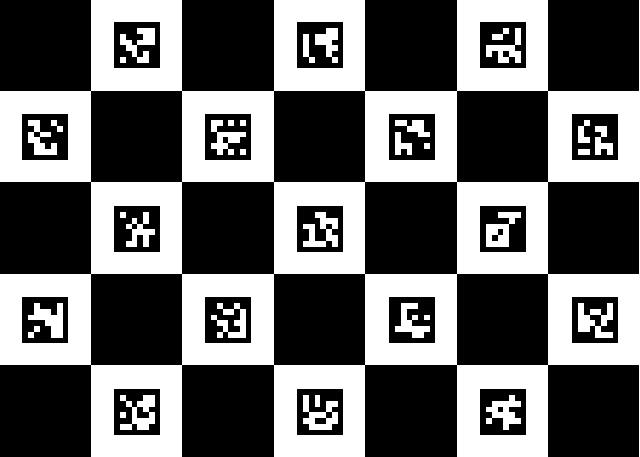

In [10]:
create_and_save_new_board()

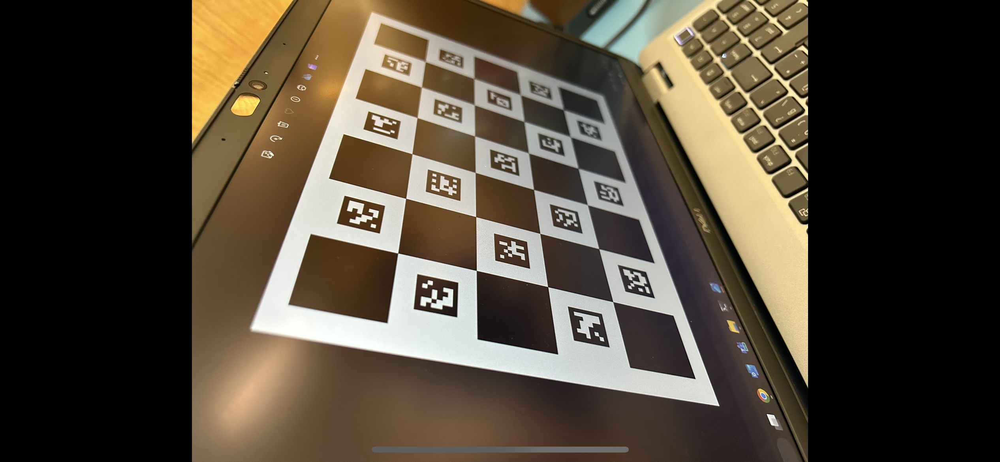

In [24]:
image_file = 'IMG_3279.PNG'
image = Image.open(image_file)
image

In [25]:
# Define the aruco dictionary and charuco board
dictionary = cv2.aruco.getPredefinedDictionary(ARUCO_DICT)
board = cv2.aruco.CharucoBoard((SQUARES_VERTICALLY, SQUARES_HORIZONTALLY), SQUARE_LENGTH, MARKER_LENGTH, dictionary)
params = cv2.aruco.DetectorParameters()
chparams = cv2.aruco.CharucoParameters()
refine_params = cv2.aruco.RefineParameters()

detector = cv2.aruco.ArucoDetector(dictionary, params)
chdetector = cv2.aruco.CharucoDetector(board, chparams, params, refine_params)



image = cv2.imread(image_file)
image_copy = image.copy()

markerCorners, markerIds, _ = detector.detectMarkers(image)
charucoCorners, charucoIds, chmarkerCorners, chmarkerIds = chdetector.detectBoard(image)

# regular_corners = {}
# for corners, marker_id in zip(markerCorners, markerIds):
#     regular_corners[marker_id[0]] = corners
# charuco_corners = {}
# for corners, marker_id in zip(chmarkerCorners, chmarkerIds):
#     charuco_corners[marker_id[0]] = corners


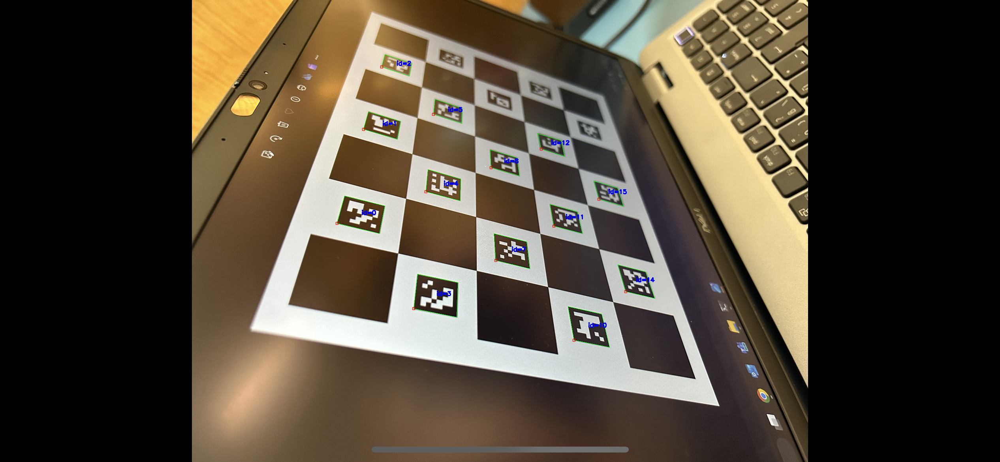

In [26]:
img = cv2.aruco.drawDetectedMarkers(image, markerCorners, markerIds)

img_color_coverted = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
pil_image = Image.fromarray(img_color_coverted)
pil_image

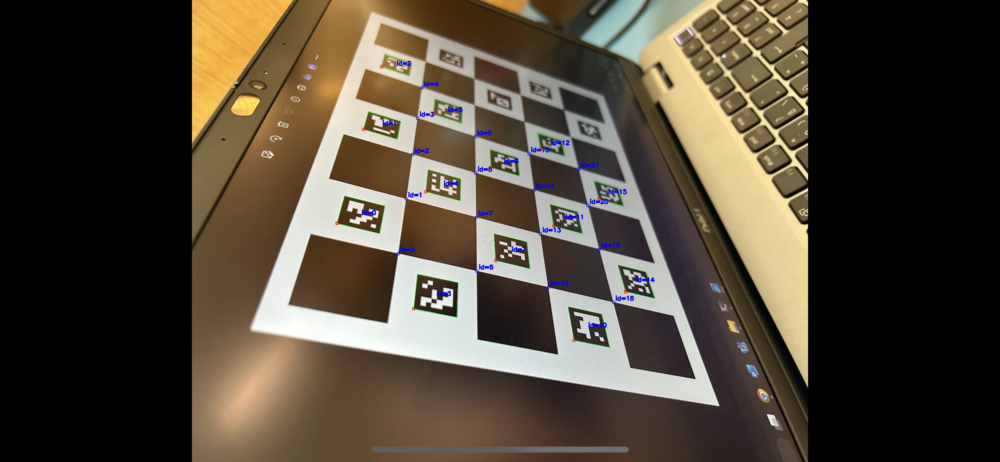

In [27]:
img = cv2.aruco.drawDetectedCornersCharuco(image, charucoCorners, charucoIds)

img = cv2.aruco.drawDetectedMarkers(image, chmarkerCorners, chmarkerIds)

img_color_coverted = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
pil_image = Image.fromarray(img_color_coverted)
pil_image

In [28]:
cameraMatrix = np.array([[2865.1, 0, 1904.5],[0, 2850.9, 1060.1], [0, 0, 1]])
distCoeffs = np.array([0.1869, -0.8542, 0, 0, 1.0])
rvec, tvec = np.zeros(3), np.zeros(3)
retval, rvec, tvec = cv2.aruco.estimatePoseCharucoBoard(charucoCorners, charucoIds, board, cameraMatrix, distCoeffs, rvec, tvec)
image = pil_to_ocv(image)
img_axes = cv2.drawFrameAxes(image, cameraMatrix, distCoeffs, rvec, tvec, 0.1)
img_axes = ocv_to_pil(img_axes)

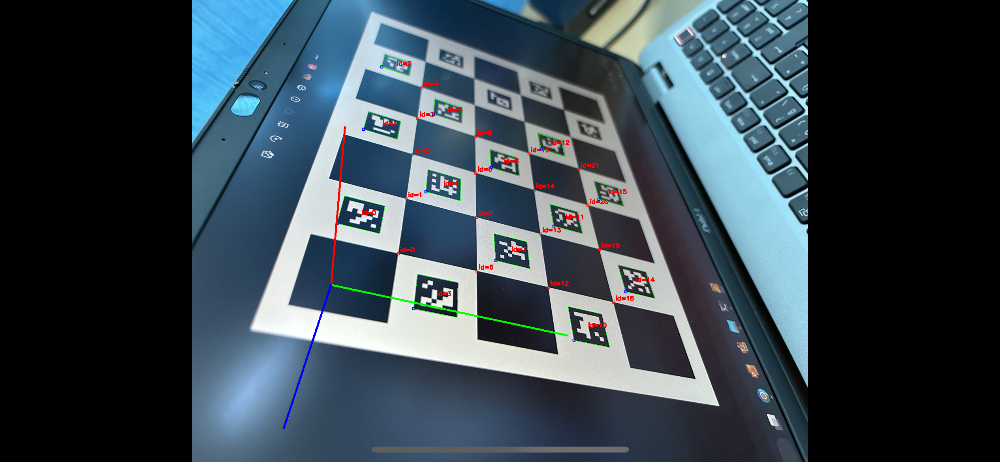

In [29]:
img_axes